In [1]:
import pandas as pd
import seaborn as sns
import numpy as np

from shapely.geometry import Point
import geopandas as gpd

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from src.config import DADOS_LIMPOS, DADOS_GEO_ORIGINAIS

In [2]:
df = pd.read_parquet(DADOS_LIMPOS)

df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedroomns_per_room
0,-122.230003,37.880001,41,880,129,322,126,8.3252,452600,NEAR BAY,5,6.984127,2.555556,0.146591
1,-122.220001,37.860001,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,2.109842,0.155797
2,-122.260002,37.840000,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,4.294117,2.026891,0.260274
3,-122.260002,37.849998,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,4.242424,2.640152,0.252679
4,-122.260002,37.840000,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,5.343676,2.362768,0.203216


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float32 
 1   latitude                  17564 non-null  float32 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float32 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float32 
 12  population_per_household  17564 non-null  float32 
 13  bedroomns_per_room        17564 non-null  floa

In [4]:
fig = px.scatter_map(df, lat='latitude', lon="longitude",
                        color_discrete_sequence=["fuchsia"], zoom=3, height=500, width=800, template='plotly_dark')
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [5]:
fig = px.scatter_map(df, lat='latitude', lon='longitude', color='median_income_cat', zoom=3, height=500, width=800, template='plotly_dark')
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [6]:
fig = px.scatter_map(df, lat='latitude', lon='longitude', color='median_house_value', zoom=3, height=500, width=800, template='plotly_dark')
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [7]:
cities = gpd.read_file(DADOS_GEO_ORIGINAIS)

C:\Users\breno\anaconda3\Lib\site-packages\pyogrio\core.py:35: RuntimeWarning:

Could not detect GDAL data files.  Set GDAL_DATA environment variable to the correct path.



In [8]:
cities = cities.to_crs(epsg=32610)
cities["centroid"] = cities.centroid
cities["centroid"] = cities["centroid"].to_crs(cities.crs)

In [9]:
geometry = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

gdf_points = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

gdf_points = gdf_points.to_crs(epsg=32610)

gdf_joined = gpd.sjoin(gdf_points, cities, how="left", predicate="within")

gdf_joined = gdf_joined.to_crs(epsg=32610)

In [10]:
gdf_joined.isnull().any(axis=1).sum()

186

In [11]:
linhas_faltantes = gdf_joined[gdf_joined.isnull().any(axis=1)].index
linhas_faltantes

Index([   45,   265,   266,   308,   312,   313,   317,   318,   320,   412,
       ...
       15752, 15755, 15756, 15942, 15970, 17198, 17199, 17201, 17232, 17258],
      dtype='int64', length=186)

In [12]:
def condado_mais_proximo(linha):
    ponto = linha['geometry']
    distancias = cities['centroid'].distance(ponto)
    idx_condado_proximo = distancias.idxmin()
    condado_proximo = cities.loc[idx_condado_proximo]
    return condado_proximo["name"]

In [13]:
condado_mais_proximo(gdf_joined.loc[308])

'San Francisco'

In [14]:
gdf_joined.loc[linhas_faltantes, ["name"]] = gdf_joined.loc[linhas_faltantes].apply(condado_mais_proximo, axis=1)

In [15]:
gdf_joined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 17564 entries, 0 to 17563
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   longitude                 17564 non-null  float32            
 1   latitude                  17564 non-null  float32            
 2   housing_median_age        17564 non-null  int8               
 3   total_rooms               17564 non-null  int16              
 4   total_bedrooms            17564 non-null  int16              
 5   population                17564 non-null  int16              
 6   households                17564 non-null  int16              
 7   median_income             17564 non-null  float32            
 8   median_house_value        17564 non-null  int32              
 9   ocean_proximity           17564 non-null  category           
 10  median_income_cat         17564 non-null  int64              
 11  rooms_per_ho

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float32 
 1   latitude                  17564 non-null  float32 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float32 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float32 
 12  population_per_household  17564 non-null  float32 
 13  bedroomns_per_room        17564 non-null  floa

In [17]:
df['city'] = gdf_joined['name']


df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float32 
 1   latitude                  17564 non-null  float32 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float32 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  int64   
 11  rooms_per_household       17564 non-null  float32 
 12  population_per_household  17564 non-null  float32 
 13  bedroomns_per_room        17564 non-null  floa

In [18]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedroomns_per_room,city
0,-122.230003,37.880001,41,880,129,322,126,8.3252,452600,NEAR BAY,5,6.984127,2.555556,0.146591,Alameda
1,-122.220001,37.860001,21,7099,1106,2401,1138,8.3014,358500,NEAR BAY,5,6.238137,2.109842,0.155797,Alameda
2,-122.260002,37.840000,42,2555,665,1206,595,2.0804,226700,NEAR BAY,2,4.294117,2.026891,0.260274,Alameda
3,-122.260002,37.849998,50,1120,283,697,264,2.1250,140000,NEAR BAY,2,4.242424,2.640152,0.252679,Alameda
4,-122.260002,37.840000,50,2239,455,990,419,1.9911,158700,NEAR BAY,2,5.343676,2.362768,0.203216,Alameda


In [19]:
df['median_income_cat'].value_counts()

df['median_income_cat'] = df['median_income_cat'].astype("category")

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17564 entries, 0 to 17563
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float32 
 1   latitude                  17564 non-null  float32 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float32 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float32 
 12  population_per_household  17564 non-null  float32 
 13  bedroomns_per_room        17564 non-null  floa

In [21]:
df['city'].value_counts()

city
Los Angeles        4831
San Diego          1466
Orange             1435
Santa Clara         824
Alameda             730
San Bernardino      729
Sacramento          622
Contra Costa        550
Riverside           504
Fresno              490
San Joaquin         387
Kern                353
Ventura             342
San Mateo           335
Sonoma              294
Stanislaus          282
Santa Barbara       262
Tulare              246
San Francisco       233
Santa Cruz          186
Solano              176
Monterey            167
Butte               144
San Luis Obispo     131
Merced              123
Marin               121
Shasta              119
Imperial            115
Humboldt            109
Placer              102
El Dorado           100
Napa                 94
Kings                86
Lake                 81
Nevada               80
Mendocino            76
Madera               75
Yolo                 74
Sutter               56
Yuba                 51
Tehama               47
Tuolumne   

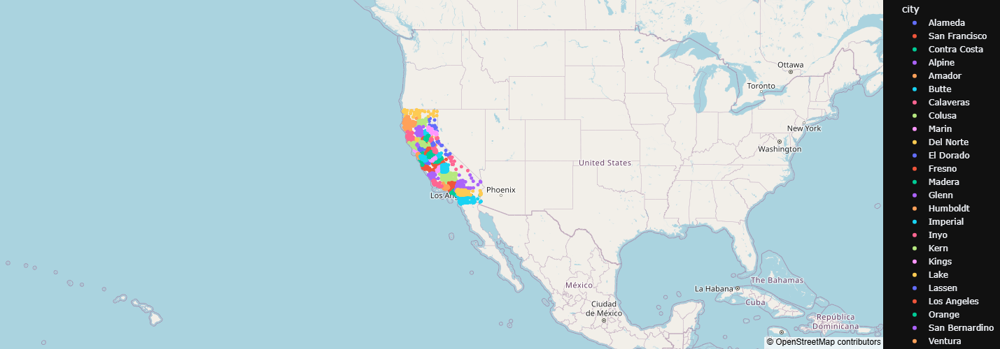

In [22]:
fig = px.scatter_map(df, lat='latitude', lon='longitude', color='city', zoom=3, height=500, width=800, template='plotly_dark')
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [23]:
df_per_city = df.groupby("city").median(numeric_only=True).reset_index()

df_per_city

,city,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room
0,Alameda,-122.129997,37.709999,35.0,1938.0,399.0,1038.5,380.5,3.57265,188500.0,5.091506,2.724138,0.206806
1,Alpine,-119.860001,38.824997,18.5,1407.5,334.0,402.5,203.5,2.00180,165050.0,7.331940,2.027528,0.236384
2,Amador,-120.720001,38.430000,17.0,1787.0,357.0,767.0,305.0,3.04650,116700.0,6.058824,2.435115,0.191900
3,Butte,-121.599998,39.709999,22.0,1875.0,372.5,936.5,356.5,2.31895,86450.0,5.308164,2.514830,0.199470
4,Calaveras,-120.559998,38.200001,17.0,2745.0,559.0,1061.0,459.0,2.56670,101600.0,5.994983,2.488000,0.204878
5,Colusa,-122.044998,39.180000,34.0,1497.0,309.0,665.0,265.0,2.50920,68950.0,5.468055,2.895284,0.204971
6,Contra Costa,-122.059998,37.950001,27.0,2399.5,439.5,1144.5,425.5,4.36605,184800.0,5.671859,2.727843,0.185150
7,Del Norte,-124.169998,41.764999,19.0,2705.5,560.5,1290.0,486.5,2.22895,76650.0,5.523724,2.721776,0.207599
8,El Dorado,-120.709999,38.759998,17.0,2244.0,451.5,900.5,351.0,3.11530,128250.0,6.178669,2.678303,0.196504
9,Fresno,-119.769997,36.759998,24.0,1923.5,376.0,1117.5,366.5,2.59020,74200.0,5.269907,3.037722,0.200158


In [24]:
df_per_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   city                      58 non-null     object 
 1   longitude                 58 non-null     float32
 2   latitude                  58 non-null     float32
 3   housing_median_age        58 non-null     float64
 4   total_rooms               58 non-null     float64
 5   total_bedrooms            58 non-null     float64
 6   population                58 non-null     float64
 7   households                58 non-null     float64
 8   median_income             58 non-null     float32
 9   median_house_value        58 non-null     float64
 10  rooms_per_household       58 non-null     float32
 11  population_per_household  58 non-null     float32
 12  bedroomns_per_room        58 non-null     float32
dtypes: float32(6), float64(6), object(1)
memory usage: 4.7+ KB


In [25]:
couty_ocean_prox = df[['city', "ocean_proximity"]].groupby('city').agg(pd.Series.mode)

In [26]:
df_per_city = df_per_city.merge(couty_ocean_prox, left_on='city', right_index=True)


df_per_city.head()

,city,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedroomns_per_room,ocean_proximity
0,Alameda,-122.129997,37.709999,35.0,1938.0,399.0,1038.5,380.5,3.57265,188500.0,5.091506,2.724138,0.206806,NEAR BAY
1,Alpine,-119.860001,38.824997,18.5,1407.5,334.0,402.5,203.5,2.00180,165050.0,7.331940,2.027528,0.236384,INLAND
2,Amador,-120.720001,38.430000,17.0,1787.0,357.0,767.0,305.0,3.04650,116700.0,6.058824,2.435115,0.191900,INLAND
3,Butte,-121.599998,39.709999,22.0,1875.0,372.5,936.5,356.5,2.31895,86450.0,5.308164,2.514830,0.199470,INLAND
4,Calaveras,-120.559998,38.200001,17.0,2745.0,559.0,1061.0,459.0,2.56670,101600.0,5.994983,2.488000,0.204878,INLAND


Para trabalhar com mapas de divisão de cidades o plotly já tem o mapa choropleth que é muito bom é totalmente personalizado assim como todos os mapas do plotly
Para ele funcionar diferente das bibliotecas acima precisamos carregar o geojson em uma variavel

In [27]:
import json
from pathlib import Path

path_geo = Path(DADOS_GEO_ORIGINAIS)

with open(path_geo, "r", encoding="utf-8") as f:
    geojson_data = json.load(f)

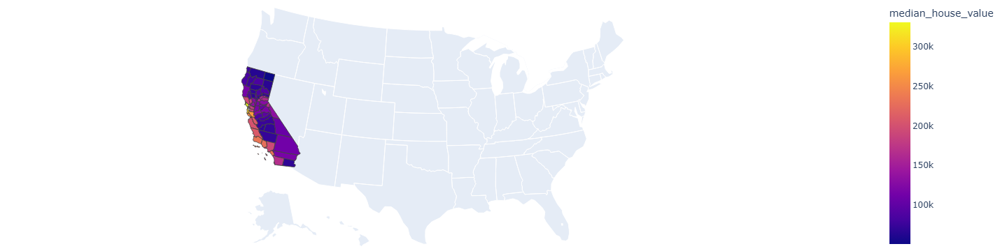

In [28]:
fig = px.choropleth(df_per_city, geojson=geojson_data, locations='city', color='median_house_value', featureidkey="properties.name",
                           scope="usa")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

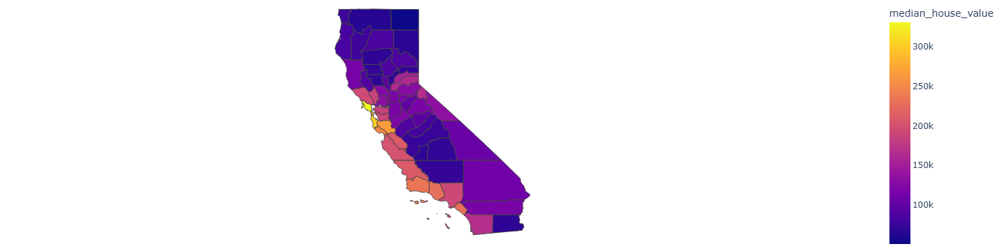

In [31]:
fig = px.choropleth(df_per_city, geojson=geojson_data, locations="city", featureidkey="properties.name", color="median_house_value", projection="mercator")
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

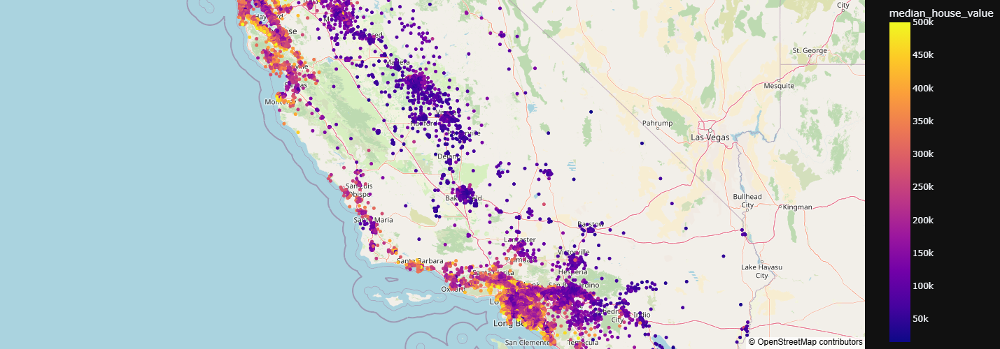

In [38]:
fig = px.scatter_map(df, lat="latitude", lon="longitude", color="median_house_value", hover_name="city", zoom=6, height=500, width=800, template="plotly_dark")
fig.update_layout(map_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
